In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import seaborn as sns



In [2]:
# Load datasets
df_calories = pd.read_csv("calories.csv")
df_exercise = pd.read_csv("exercise_dataset.csv")

 Imported Pandas and the required  training datasets 

In [3]:
print(df_calories.head())
print(df_exercise.head())   #Testing if dataset is getting displayed 

    User_ID  Gender  Age  Height  Weight  Duration  Heart_Rate  Body_Temp  \
0  14733363    male   68   190.0    94.0      29.0       105.0       40.8   
1  14861698  female   20   166.0    60.0      14.0        94.0       40.3   
2  11179863    male   69   179.0    79.0       5.0        88.0       38.7   
3  16180408  female   34   179.0    71.0      13.0       100.0       40.5   
4  17771927  female   27   154.0    58.0      10.0        81.0       39.8   

   Calories  
0     231.0  
1      66.0  
2      26.0  
3      71.0  
4      35.0  
                              Activity  130 lb  155 lb  180 lb  205 lb  \
0          Cycling, mountain bike, bmx     502     598     695     791   
1  Cycling, <10 mph, leisure bicycling     236     281     327     372   
2             Cycling, >20 mph, racing     944    1126    1308    1489   
3          Cycling, 10-11.9 mph, light     354     422     490     558   
4       Cycling, 12-13.9 mph, moderate     472     563     654     745   

   Calor

In [4]:
print(df_calories.info())
print(df_exercise.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   User_ID     15000 non-null  int64  
 1   Gender      15000 non-null  object 
 2   Age         15000 non-null  int64  
 3   Height      15000 non-null  float64
 4   Weight      15000 non-null  float64
 5   Duration    15000 non-null  float64
 6   Heart_Rate  15000 non-null  float64
 7   Body_Temp   15000 non-null  float64
 8   Calories    15000 non-null  float64
dtypes: float64(6), int64(2), object(1)
memory usage: 1.0+ MB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 248 entries, 0 to 247
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Activity         248 non-null    object 
 1   130 lb           248 non-null    int64  
 2   155 lb           248 non-null    int64  
 3   180 lb           248 non-null    in

### Data cleaning and Handling missing values 
Removing rows which might have missing values . 
Alternately missing values can be filled with the mean, median, or mode, depending on the data type: df.fillna(df.mean(), inplace=True)  # For numerical columns
In this scenario , i am dropping the missing values . 
Also , Z-Score can be used to remove any outliers (Values which might the model slow or give inaccurate answers ) 


In [5]:
df_exercise.dropna(inplace=True)
df_calories.dropna(inplace=True)
df_exercise.drop_duplicates(inplace=True) # Removing Duplicate Values
df_calories.drop_duplicates(inplace=True)

### Starting the Merge procedure for both the datasets 

In [6]:
# Convert weight columns in df_exercise to strings for proper matching
weight_columns = ['130 lb', '155 lb', '180 lb', '205 lb']
df_exercise.rename(columns={col: col.replace(" ", "") for col in weight_columns}, inplace=True)

In [7]:
# Define function to map weight to category
def map_weight_to_column(weight):
    if weight <= 130:
        return '130lb'
    elif weight <= 155:
        return '155lb'
    elif weight <= 180:
        return '180lb'
    elif weight <= 205:
        return '205lb'
    else:
        return '205lb'

In [8]:
# Apply mapping
df_calories['Weight_Category'] = df_calories['Weight'].apply(map_weight_to_column)

In [9]:
# Randomly assign an Activity to each user , since activities are not yet assigned to users from first dataset 
df_calories['Activity'] = np.random.choice(df_exercise['Activity'], size=len(df_calories), replace=True)


In [10]:
df_calories['Weight_Category'] = df_calories['Weight_Category'].astype(str)
df_exercise.columns = df_exercise.columns.astype(str)  # Convert all column names to strings


In [11]:
# Convert column names in df_exercise to strings
df_exercise.columns = df_exercise.columns.astype(str)

# Merge only on 'Activity'
df_merged = df_calories.merge(df_exercise, how='left', on='Activity')

# Select the correct column dynamically using .apply() and .get()
df_merged['Calories_Burned'] = df_merged.apply(lambda row: row.get(str(row['Weight_Category']), None), axis=1)


In [12]:
print(df_merged) # Checking if merged  data getting displayed or not 

        User_ID  Gender  Age  Height  Weight  Duration  Heart_Rate  Body_Temp  \
0      14733363    male   68   190.0    94.0      29.0       105.0       40.8   
1      14861698  female   20   166.0    60.0      14.0        94.0       40.3   
2      11179863    male   69   179.0    79.0       5.0        88.0       38.7   
3      16180408  female   34   179.0    71.0      13.0       100.0       40.5   
4      17771927  female   27   154.0    58.0      10.0        81.0       39.8   
...         ...     ...  ...     ...     ...       ...         ...        ...   
14995  15644082  female   20   193.0    86.0      11.0        92.0       40.4   
14996  17212577  female   27   165.0    65.0       6.0        85.0       39.2   
14997  17271188  female   43   159.0    58.0      16.0        90.0       40.1   
14998  18643037    male   78   193.0    97.0       2.0        84.0       38.3   
14999  11751526    male   63   173.0    79.0      18.0        92.0       40.5   

       Calories Weight_Cate

### Starting with feature engineering 

In [13]:
df_merged['Total_Calories_Burned'] = df_merged['Calories_Burned'] * df_merged['Duration'] #Calculating total calories burned 


In [14]:
missing_data = df_merged[df_merged['Calories_Burned'].isnull()]
print(missing_data)
# checking missing values in new merged file 

Empty DataFrame
Columns: [User_ID, Gender, Age, Height, Weight, Duration, Heart_Rate, Body_Temp, Calories, Weight_Category, Activity, 130lb, 155lb, 180lb, 205lb, Calories per kg, Calories_Burned, Total_Calories_Burned]
Index: []


Missing values can either be dropped or Replaced by other values .  I am Replacing them with Mean(Average) .


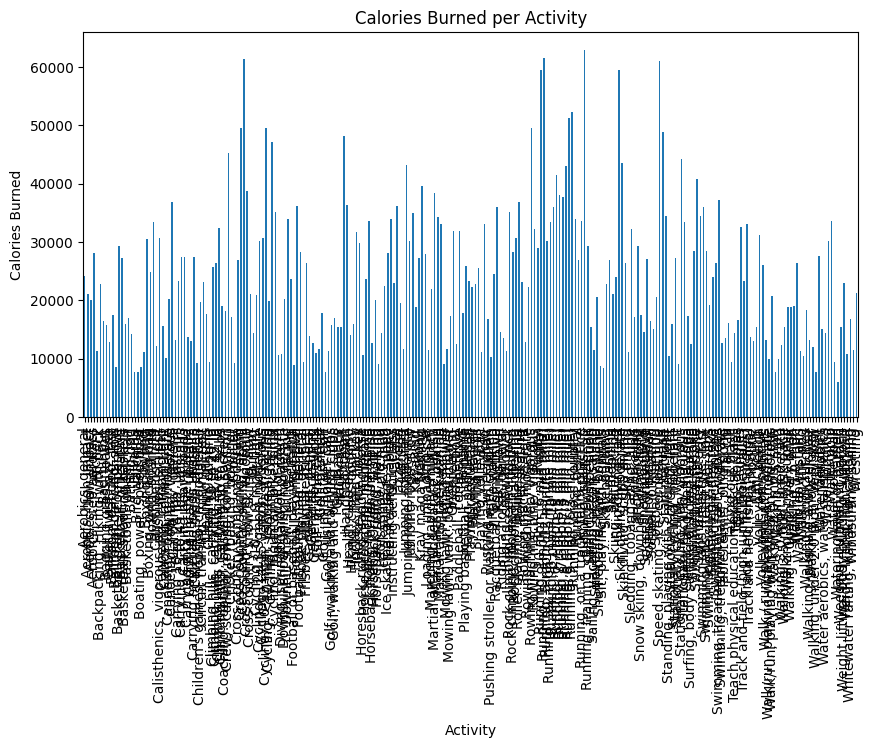

In [15]:
df_merged.groupby('Activity')['Calories_Burned'].sum().plot(kind='bar', figsize=(10, 5))
plt.title('Calories Burned per Activity')
plt.ylabel('Calories Burned')
plt.show()


### Visualizing the data 

status = success

In [16]:
print(df_merged.describe())


            User_ID           Age        Height        Weight      Duration  \
count  1.500000e+04  15000.000000  15000.000000  15000.000000  15000.000000   
mean   1.497736e+07     42.789800    174.465133     74.966867     15.530600   
std    2.872851e+06     16.980264     14.258114     15.035657      8.319203   
min    1.000116e+07     20.000000    123.000000     36.000000      1.000000   
25%    1.247419e+07     28.000000    164.000000     63.000000      8.000000   
50%    1.499728e+07     39.000000    175.000000     74.000000     16.000000   
75%    1.744928e+07     56.000000    185.000000     87.000000     23.000000   
max    1.999965e+07     79.000000    222.000000    132.000000     30.000000   

         Heart_Rate     Body_Temp      Calories         130lb         155lb  \
count  15000.000000  15000.000000  15000.000000  15000.000000  15000.000000   
mean      95.518533     40.025453     89.539533    388.794133    463.545533   
std        9.583328      0.779230     62.456978    

### Visualizing some more data to gain insights


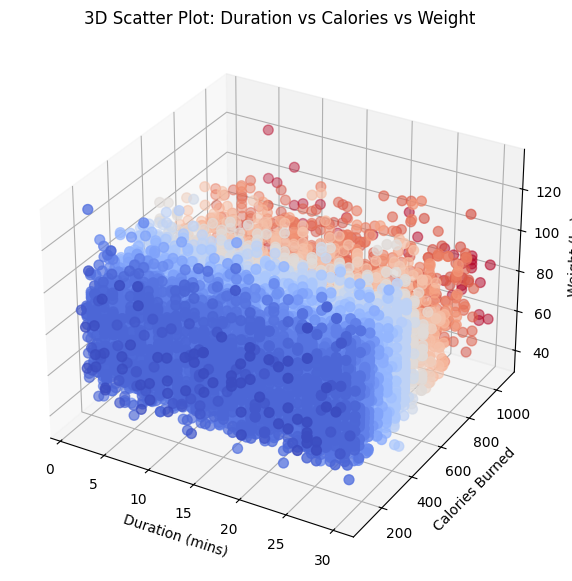

In [17]:
# Create the 3D plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Plotting
ax.scatter(df_merged['Duration'], df_merged['Calories_Burned'], df_merged['Weight'], 
           c=df_merged['Calories_Burned'], cmap='coolwarm', s=50)

# Labels
ax.set_xlabel('Duration (mins)')
ax.set_ylabel('Calories Burned')
ax.set_zlabel('Weight (kg)')
ax.set_title('3D Scatter Plot: Duration vs Calories vs Weight')

plt.show()

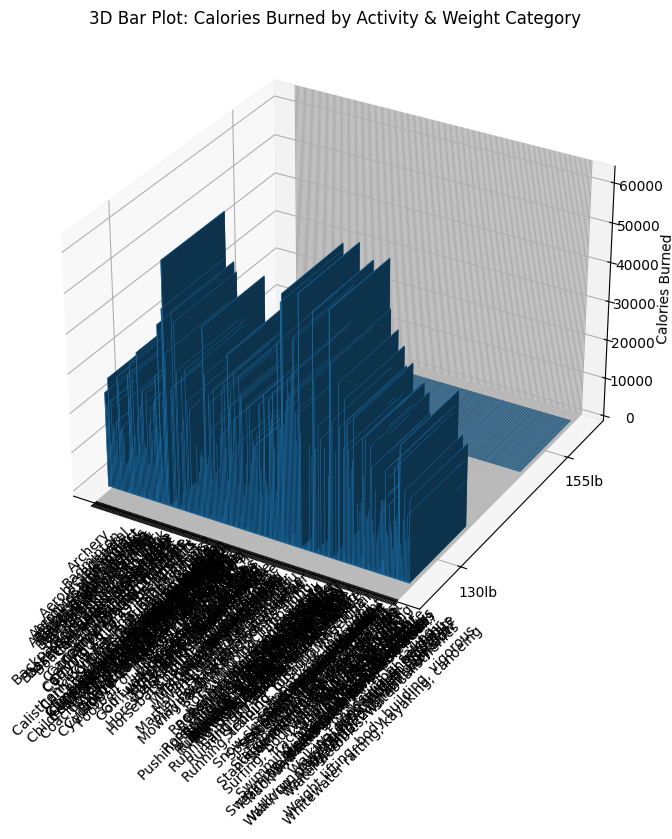

In [18]:
# Group data
grouped = df_merged.groupby(['Activity', 'Weight_Category'])['Calories_Burned'].sum().reset_index()

# Map categories to numbers
activities = grouped['Activity'].unique()
weights = grouped['Weight_Category'].unique()
x_pos = np.arange(len(activities))
y_pos = np.arange(len(weights))
x, y = np.meshgrid(x_pos, y_pos)

# Reshape data
z = np.zeros_like(x)
dx = dy = 0.5
dz = grouped.pivot(index='Weight_Category', columns='Activity', values='Calories_Burned').fillna(0).values.flatten()

# Plotting
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
ax.bar3d(x.flatten(), y.flatten(), z.flatten(), dx, dy, dz, shade=True, cmap='viridis')

# Labels
ax.set_xticks(x_pos + dx / 2)
ax.set_xticklabels(activities, rotation=45)
ax.set_yticks(y_pos + dy / 2)
ax.set_yticklabels(weights)
ax.set_zlabel('Calories Burned')

plt.title('3D Bar Plot: Calories Burned by Activity & Weight Category')
plt.show()


In [19]:


fig = px.scatter_3d(df_merged, 
                    x='Duration', 
                    y='Calories_Burned', 
                    z='Weight', 
                    color='Activity', 
                    size='Calories_Burned',
                    title='Interactive 3D Scatter Plot')
fig.show()


## Data Preprocessing 
    Involves,
1. Encoding categorical variables ,
2. Feature scaling (KNN or SVM etc)  ,
3. Spliting the dataset(training set and testing set ) 
### Encoding Categorical Variables 
Since we r  having columns like 'Activity' and 'Weight_Category', we'll apply encoding techniques: (so that it can be readily used by our ML model later ) 
- Label Encoding (for ordinal categories, if any).
- One-Hot Encoding (for nominal categories like 'Activity').

In [20]:
# Check for categorical columns
categorical_cols = df_merged.select_dtypes(include=['object']).columns
print(categorical_cols)


Index(['Gender', 'Weight_Category', 'Activity'], dtype='object')


In [21]:
# Applying One-hot encoding
df_encoded = pd.get_dummies(df_merged, columns=['Activity', 'Weight_Category'], drop_first=True) #

# Check the new dataframe
print(df_encoded.head())

    User_ID  Gender  Age  Height  Weight  Duration  Heart_Rate  Body_Temp  \
0  14733363    male   68   190.0    94.0      29.0       105.0       40.8   
1  14861698  female   20   166.0    60.0      14.0        94.0       40.3   
2  11179863    male   69   179.0    79.0       5.0        88.0       38.7   
3  16180408  female   34   179.0    71.0      13.0       100.0       40.5   
4  17771927  female   27   154.0    58.0      10.0        81.0       39.8   

   Calories  130lb  ...  Activity_Water polo  Activity_Water volleyball  \
0     231.0    236  ...                False                      False   
1      66.0    413  ...                False                      False   
2      26.0    148  ...                False                      False   
3      71.0    384  ...                False                      False   
4      35.0    472  ...                False                      False   

   Activity_Watering lawn or garden  Activity_Weeding, cultivating garden  \
0        

- Above , drop_first=True helps avoid the dummy variable trap (multicollinearity).
- Multicollinearity occurs when two or more explanatory variables in a multiple regression model are highly linearly related. 

### Splitting the data into Training set and Testing set

In [22]:
X = df_encoded.drop('Calories_Burned', axis=1)
y = df_encoded['Calories_Burned']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### Model Selection : Using Linear Regression 

Applying linear regression 

**Fixing non-numeric columns so that Linear Regression can run properly**
**Since Linear Regression requires numeric data to run**

In [23]:
# Identify non-numeric columns
non_numeric_cols = X_train.select_dtypes(include=['object']).columns
print("Non-numeric columns:", non_numeric_cols)

# Apply one-hot encoding to non-numeric columns
X_train = pd.get_dummies(X_train, columns=non_numeric_cols, drop_first=True)
X_test = pd.get_dummies(X_test, columns=non_numeric_cols, drop_first=True)

# Align train and test sets to have the same columns
X_train, X_test = X_train.align(X_test, join='left', axis=1, fill_value=0)

Non-numeric columns: Index(['Gender'], dtype='object')


In [24]:
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

LinearRegression()

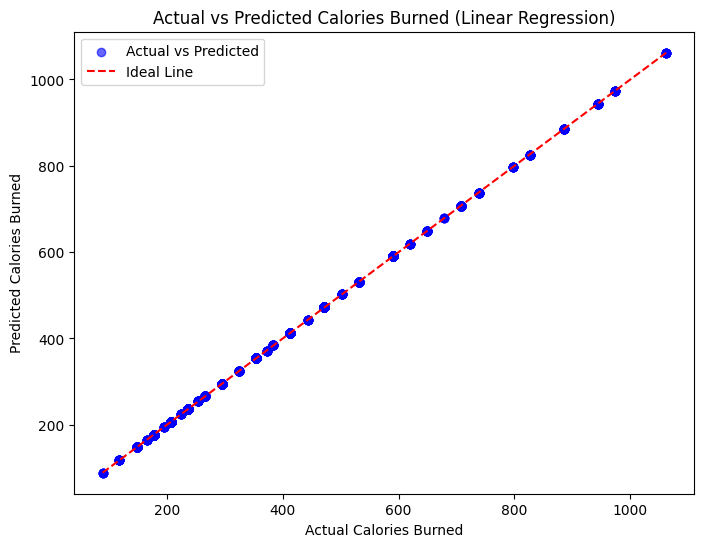

In [25]:
# Predict on the test set
y_pred = lr_model.predict(X_test)

# Plot actual vs predicted values
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, color='blue', alpha=0.6, label='Actual vs Predicted')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--', label='Ideal Line')

# Add labels and title
plt.xlabel('Actual Calories Burned')
plt.ylabel('Predicted Calories Burned')
plt.title('Actual vs Predicted Calories Burned (Linear Regression)')
plt.legend()

# Show the plot
plt.show()

**Additional Visualizations**
  1. Residual Plot : helps diagnose model performance
  2. Feature Importance Plot :  shows the contribution of each feature to the model.

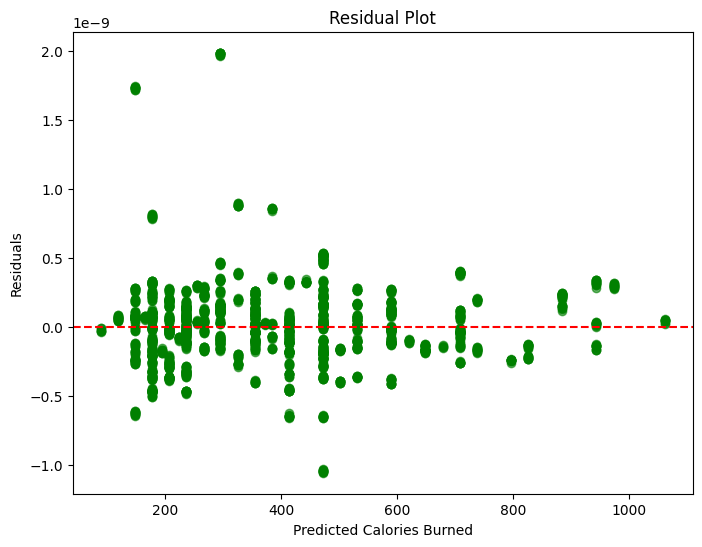

In [26]:
residuals = y_test - y_pred

plt.figure(figsize=(8, 6))
plt.scatter(y_pred, residuals, color='green', alpha=0.6)
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Calories Burned')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

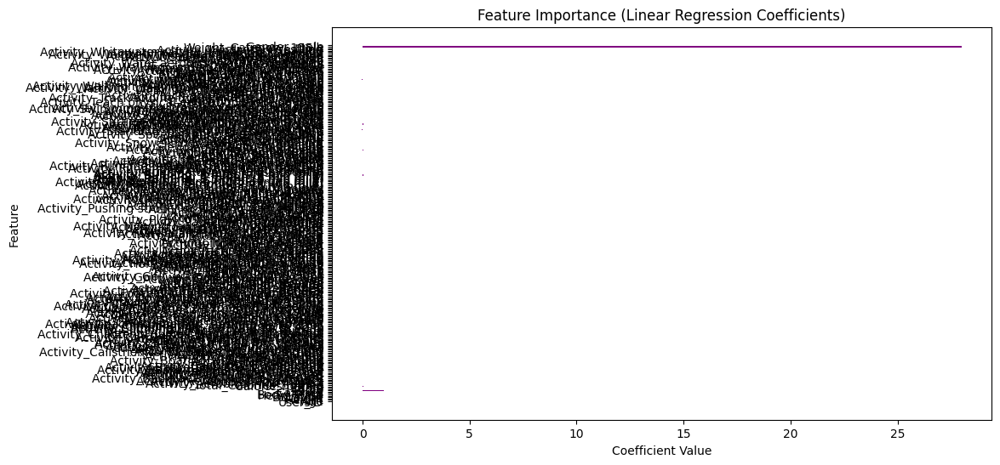

In [27]:
coefficients = lr_model.coef_
feature_names = X_train.columns

plt.figure(figsize=(10, 6))
plt.barh(feature_names, coefficients, color='purple')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.title('Feature Importance (Linear Regression Coefficients)')
plt.show()

**As can be seen above , my feature importance plot isn't showing proper values or the coffecients seems off**
Reasons might be Scaling Issues or multicollinearity . This case feels as a bit of scaling problem . 
scaling issues : Linear regression coefficients are sensitive to the scale of the features. If some features are on a much larger scale than others, their coefficients might dominate the plot.
Solution will be to scale my features before fitting the model (e.g., using StandardScaler or MinMaxScaler).

**Using StandardScaler** To Scale properly and visualize the feature plot correctly 
 

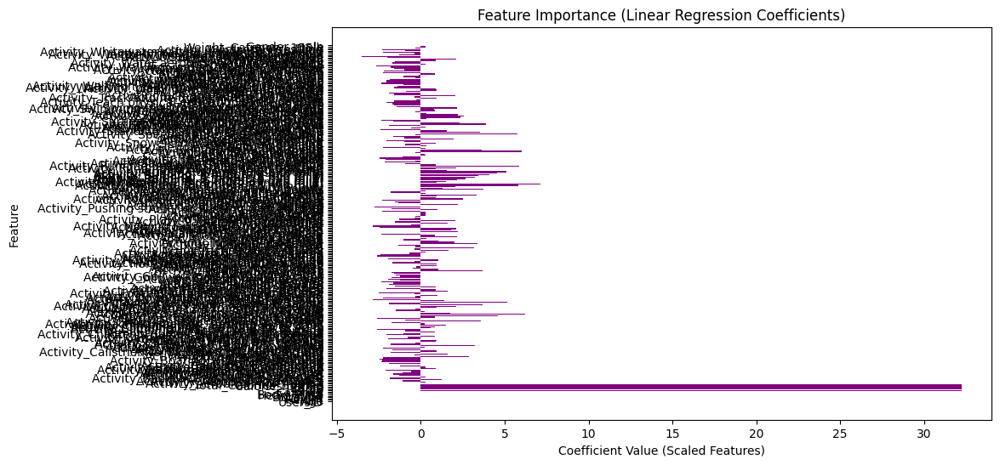

In [28]:
from sklearn.preprocessing import StandardScaler

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Fit the linear regression model on scaled data
lr_model_scaled = LinearRegression()
lr_model_scaled.fit(X_train_scaled, y_train)

# Get coefficients and feature names
coefficients = lr_model_scaled.coef_
feature_names = X_train.columns

# Plot feature importance
plt.figure(figsize=(10, 6))
plt.barh(feature_names, coefficients, color='purple')
plt.xlabel('Coefficient Value (Scaled Features)')
plt.ylabel('Feature')
plt.title('Feature Importance (Linear Regression Coefficients)')
plt.show()

**SUCCESS**